In [1]:
import datetime as dt
import itertools as it
import numpy as np
import time
import pandas as pd
pd.set_option('display.max_columns', 50)

import requests
import re
from bs4 import BeautifulSoup
import tabula

import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patheffects as path_effects
from matplotlib import ticker
import matplotlib.ticker as mtick
from matplotlib.gridspec import GridSpec
plt.rcParams['figure.facecolor'] = 'white'
plt.rcParams['axes.facecolor'] = 'white'
plt.rcParams['savefig.facecolor'] = 'white'
plt.rc('axes', axisbelow=True)

In [2]:
fn = '/Users/brennan/Desktop/code/misc/permutation_entropy/data/infectious_disease_predictability/Data/'

In [228]:
chlamydia = pd.read_csv(fn+'CHLAMYDIA_Cases_2006-2014_20160707103149.csv',
                        skiprows=2).iloc[:,:-1]
gonorrhea = pd.read_csv(fn+'GONORRHEA_Cases_1972-2014_20160707103202.csv',
                        skiprows=2).iloc[:,:-1]
hepatitis = pd.read_csv(fn+'HEPATITIS_A_Cases_1966-2014_20160707103116.csv',
                        skiprows=2).iloc[:,:-1]
influenza = pd.read_csv(fn+'INFLUENZA_Cases_1919-1951_20151014132002.csv',
                        skiprows=2).iloc[:,:-1]
measles_c = pd.read_csv(fn+'MEASLES_Cases_1909-2001_20150923120449.csv',
                        skiprows=0).iloc[:,:-1]
pertussis = pd.read_csv(fn+'WHOOPING_COUGH_[PERTUSSIS]_Cases_1909-2014_20160607104756.csv',
                        skiprows=2).iloc[:,:-1]
mumps_var = pd.read_csv(fn+'MUMPS_Cases_1967-2014_20160707103045.csv',
                        skiprows=2).iloc[:,:-1]
poliomyel = pd.read_csv(fn+'POLIOMYELITIS_Cases_1921-1971_20150923114821.csv',
                        skiprows=2).iloc[:,:-1]


# 

chlamydia = chlamydia.mask(chlamydia=='-')
gonorrhea = gonorrhea.mask(gonorrhea=='-')
hepatitis = hepatitis.mask(hepatitis=='-')
influenza = influenza.mask(influenza=='-')
measles_c = measles_c.mask(measles_c=='-')
pertussis = pertussis.mask(pertussis=='-')
mumps_var = mumps_var.mask(mumps_var=='-')
poliomyel = poliomyel.mask(poliomyel=='-')

cols = ['ALABAMA', 'ALASKA', 'ARIZONA', 'ARKANSAS', 'CALIFORNIA',
        'COLORADO', 'CONNECTICUT', 'DELAWARE', 'FLORIDA', 'GEORGIA',
        'HAWAII', 'IDAHO', 'ILLINOIS', 'INDIANA', 'IOWA', 'KANSAS',
        'KENTUCKY', 'LOUISIANA', 'MAINE', 'MARYLAND', 'MASSACHUSETTS',
        'MICHIGAN', 'MINNESOTA', 'MISSISSIPPI', 'MISSOURI', 'MONTANA',
        'NEBRASKA', 'NEVADA', 'NEW HAMPSHIRE', 'NEW JERSEY', 'NEW MEXICO',
        'NEW YORK', 'NEW YORK CITY', 'NORTH CAROLINA', 'NORTH DAKOTA',
        'OHIO', 'OKLAHOMA', 'OREGON', 'PENNSYLVANIA', 'RHODE ISLAND',
        'SOUTH CAROLINA', 'SOUTH DAKOTA', 'TENNESSEE', 'TEXAS', 'UTAH',
        'VERMONT', 'VIRGINIA', 'WASHINGTON', 'WEST VIRGINIA', 'WISCONSIN','WYOMING']

for i in cols:
    chlamydia[i] = chlamydia[i].astype(float)
    gonorrhea[i] = gonorrhea[i].astype(float)
    hepatitis[i] = hepatitis[i].astype(float)
    influenza[i] = influenza[i].astype(float)
    measles_c[i] = measles_c[i].astype(float)
    pertussis[i] = pertussis[i].astype(float)
    mumps_var[i] = mumps_var[i].astype(float)    
    poliomyel[i] = poliomyel[i].astype(float)        

51
50
50
43
45
51
22
48


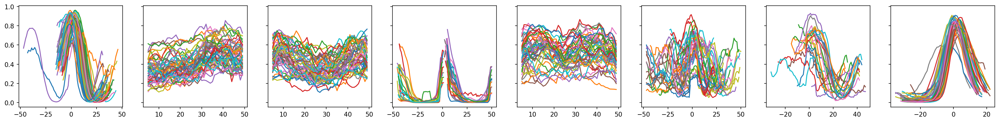

360


In [280]:
fig, ax = plt.subplots(1,8,figsize=(28,3),dpi=150,sharey=True)
wid = 8

out = []

z = 0 
for x in cols:
    tmp_i = measles_c.groupby('WEEK').agg({i:np.nanmean for i in cols})
    minmax = (tmp_i[x]-tmp_i[x].min())/(tmp_i[x].max()-tmp_i[x].min())
    if minmax.isna().sum() < 2:
        whmax = minmax[minmax==minmax.max()].index[0]
        xvals = (np.array(list(minmax.index)+list(minmax.index))-np.where(np.array(list(minmax.index)+list(minmax.index))==whmax)[0][0])[:53]
        ax[0].plot(xvals,minmax.rolling(window=wid,center=True).mean().values)
#         ax[4].plot(tmp_i.index,minmax.rolling(window=wid,center=True).mean().values)        
        out.append(minmax.rolling(window=wid,center=True).mean().values)
        z += 1
print(z)

z = 0 
for x in cols:
    tmp_i = gonorrhea.groupby('WEEK').agg({i:np.nanmean for i in cols})
    minmax = (tmp_i[x]-tmp_i[x].min())/(tmp_i[x].max()-tmp_i[x].min())
    if minmax.isna().sum() < 2:
        ax[1].plot(tmp_i.index,minmax.rolling(window=wid,center=True).mean().values)
        out.append(minmax.rolling(window=wid,center=True).mean().values)
        z += 1
print(z)
    
z = 0 
for x in cols:
    tmp_i = hepatitis.groupby('WEEK').agg({i:np.nanmean for i in cols})
    minmax = (tmp_i[x]-tmp_i[x].min())/(tmp_i[x].max()-tmp_i[x].min())
    if minmax.isna().sum() < 2:
        ax[2].plot(tmp_i.index,minmax.rolling(window=wid,center=True).mean().values)
        out.append(minmax.rolling(window=wid,center=True).mean().values)
        z += 1
print(z)

z = 0 
for x in cols:
    tmp_i = influenza.groupby('WEEK').agg({i:np.nanmean for i in cols})
    minmax = (tmp_i[x]-tmp_i[x].min())/(tmp_i[x].max()-tmp_i[x].min())
    if minmax.isna().sum() < 2:
        whmax = minmax[minmax==minmax.max()].index[0]
        xvals = (np.array(list(minmax.index)+list(minmax.index))-np.where(np.array(list(minmax.index)+list(minmax.index))==whmax)[0][0])[:53]
        ax[3].plot(xvals,minmax.rolling(window=wid,center=True).mean().values)
#         ax[3].plot(tmp_i.index,minmax.rolling(window=wid,center=True).mean().values)
        out.append(minmax.rolling(window=wid,center=True).mean().values)
        z += 1
print(z)

z = 0 
for x in cols:
    tmp_i = chlamydia.groupby('WEEK').agg({i:np.nanmean for i in cols})
    minmax = (tmp_i[x]-tmp_i[x].min())/(tmp_i[x].max()-tmp_i[x].min())
    if minmax.isna().sum() < 2:
        ax[4].plot(tmp_i.index,minmax.rolling(window=wid,center=True).mean().values)
        out.append(minmax.rolling(window=wid,center=True).mean().values)
        z += 1
print(z)

z = 0 
for x in cols:
    tmp_i = pertussis.groupby('WEEK').agg({i:np.nanmean for i in cols})
    minmax = (tmp_i[x]-tmp_i[x].min())/(tmp_i[x].max()-tmp_i[x].min())
    if minmax.isna().sum() < 2:
        whmax = minmax[minmax==minmax.max()].index[0]
        xvals = (np.array(list(minmax.index)+list(minmax.index))-np.where(np.array(list(minmax.index)+list(minmax.index))==whmax)[0][0])[:53]
        ax[5].plot(xvals,minmax.rolling(window=wid,center=True).mean().values)
        out.append(minmax.rolling(window=wid,center=True).mean().values)
        z += 1
print(z)

z = 0 
for x in cols:
    tmp_i = mumps_var.groupby('WEEK').agg({i:np.nanmean for i in cols})
    minmax = (tmp_i[x]-tmp_i[x].min())/(tmp_i[x].max()-tmp_i[x].min())
    if minmax.isna().sum() < 1:
        whmax = minmax[minmax==minmax.max()].index[0]
        xvals = (np.array(list(minmax.index)+list(minmax.index))-np.where(np.array(list(minmax.index)+list(minmax.index))==whmax)[0][0])[:53]
        ax[6].plot(xvals,minmax.rolling(window=wid,center=True).mean().values)
        out.append(minmax.rolling(window=wid,center=True).mean().values)
        z += 1
print(z)

z = 0 
for x in cols:
    tmp_i = poliomyel.groupby('WEEK').agg({i:np.nanmean for i in cols})
    minmax = (tmp_i[x]-tmp_i[x].min())/(tmp_i[x].max()-tmp_i[x].min())
    if minmax.isna().sum() < 1:
        whmax = minmax[minmax==minmax.max()].index[0]
        xvals = (np.array(list(minmax.index)+list(minmax.index))-np.where(np.array(list(minmax.index)+list(minmax.index))==whmax)[0][0])[:53]
        ax[7].plot(xvals,minmax.rolling(window=wid,center=True).mean().values)
        out.append(minmax.rolling(window=wid,center=True).mean().values)
        z += 1
print(z)

plt.show()
print(len(out))

In [249]:
len(out)/18

20.0

In [199]:
import cmocean as cmo

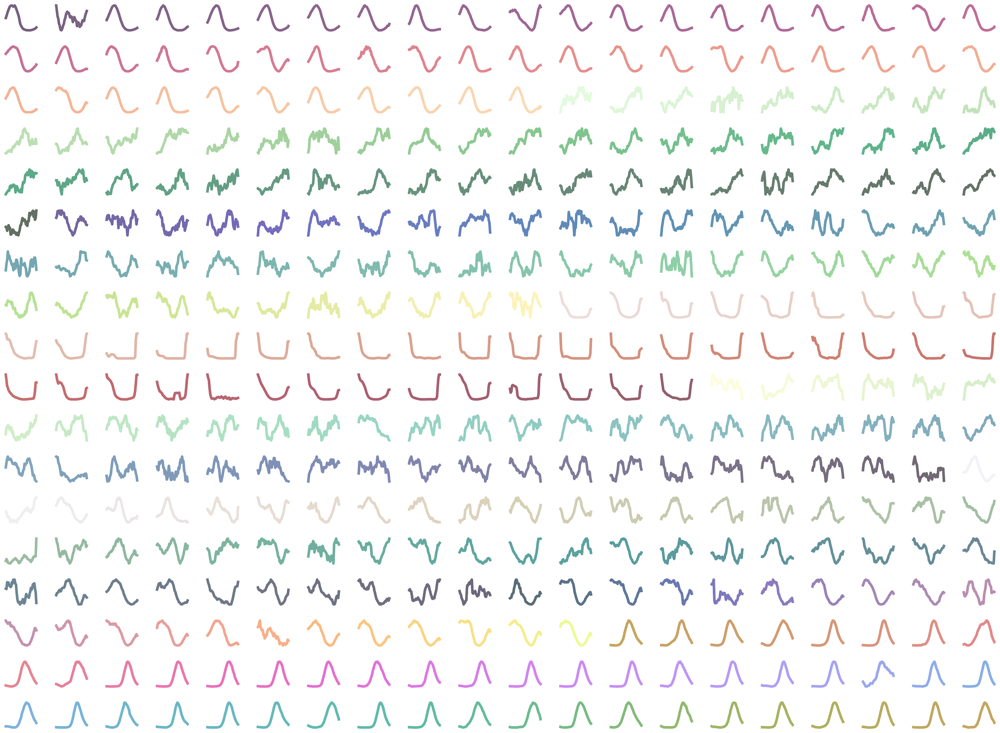

In [312]:
w = 1.2
h = 1.0
ncols = 20
nrows = 18
mult = 1.25

fig, ax = plt.subplots(nrows, ncols, figsize=(ncols*w*mult,nrows*h*mult), dpi=150)
plt.subplots_adjust(wspace=0.5,hspace=0.5)
tups = list(it.product(range(nrows), range(ncols)))


c = list(cmo.cm.matter_r(np.linspace(0,0.9,51))) +\
    list(cmo.cm.algae(   np.linspace(0,1,50))) +\
    list(cmo.cm.haline(  np.linspace(0,1,50))) +\
    list(cmo.cm.amp(     np.linspace(0.1,0.9,43))) +\
    list(cmo.cm.deep(    np.linspace(0,1,45))) +\
    list(cmo.cm.rain(    np.linspace(0,1,51))) +\
    list(cmo.cm.thermal( np.linspace(0,1,22))) +\
    list(cmo.cm.phase(   np.linspace(0,1,48)))

lw = 3.5
outx = out.copy()
# np.random.shuffle(outx)

for i, a in enumerate(tups):
    std_i = pd.Series(outx[i]).diff().std()
    ax[a].plot(outx[i],lw=lw*1.2,color=c[i])
    ax[a].plot(outx[i],lw=lw*1.1,color='.99',alpha=0.35)
    ax[a].set_axis_off()

plt.savefig('figs/pngs/sam_title_slide_360_sorted.png',dpi=600,bbox_inches='tight')
plt.show()

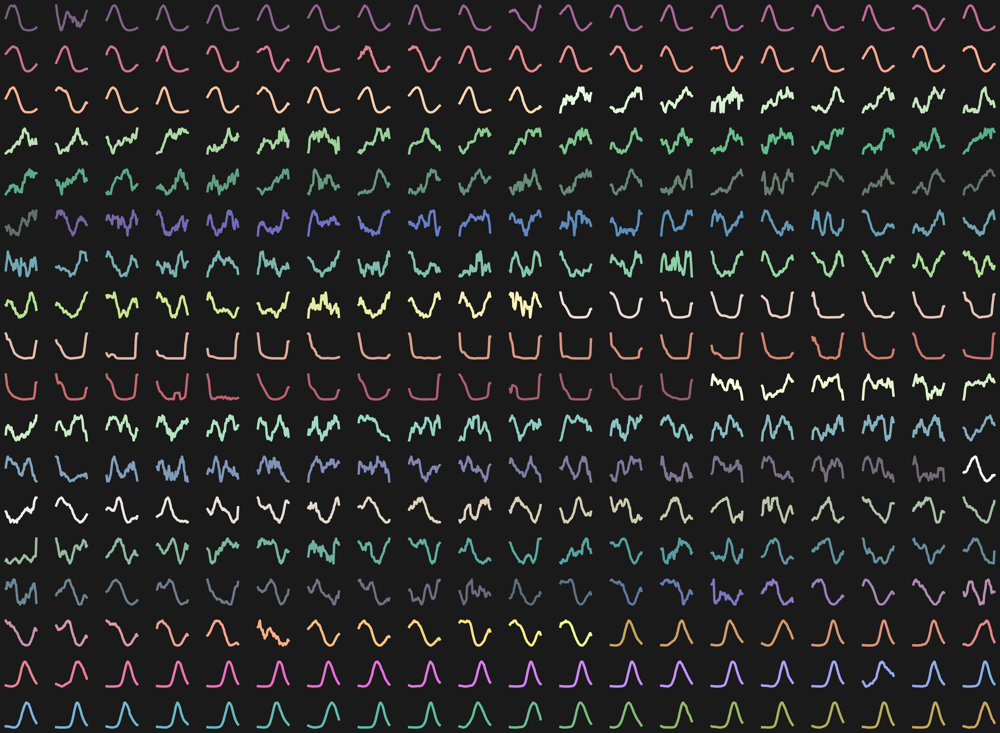

In [314]:
w = 1.2
h = 1.0
ncols = 20
nrows = 18
mult = 1.25

fig, ax = plt.subplots(nrows, ncols, figsize=(ncols*w*mult,nrows*h*mult), dpi=150,facecolor='.1')
plt.subplots_adjust(wspace=0.5,hspace=0.5)
tups = list(it.product(range(nrows), range(ncols)))


c = list(cmo.cm.matter_r(np.linspace(0,0.9,51))) +\
    list(cmo.cm.algae(   np.linspace(0,1,50))) +\
    list(cmo.cm.haline(  np.linspace(0,1,50))) +\
    list(cmo.cm.amp(     np.linspace(0.1,0.9,43))) +\
    list(cmo.cm.deep(    np.linspace(0,1,45))) +\
    list(cmo.cm.rain(    np.linspace(0,1,51))) +\
    list(cmo.cm.thermal( np.linspace(0,1,22))) +\
    list(cmo.cm.phase(   np.linspace(0,1,48)))

lw = 3.5
outx = out.copy()
# np.random.shuffle(outx)

for i, a in enumerate(tups):
    std_i = pd.Series(outx[i]).diff().std()
    ax[a].plot(outx[i],lw=lw*1.2,color=c[i])
    ax[a].plot(outx[i],lw=lw*1.1,color='.99',alpha=0.35)
    ax[a].set_axis_off()

plt.savefig('figs/pngs/sam_title_slide_360_sorted_dark2.png',dpi=600,bbox_inches='tight',facecolor='.1')
plt.show()

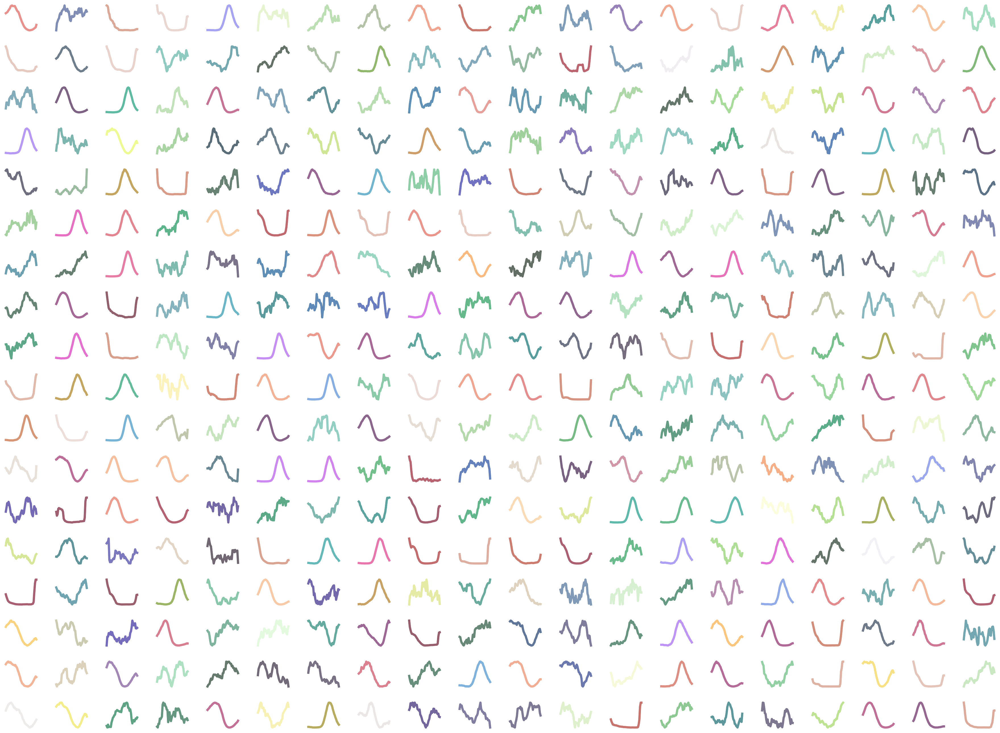

In [290]:
w = 1.2
h = 1.0
ncols = 20
nrows = 18
mult = 1.25

fig, ax = plt.subplots(nrows, ncols, figsize=(ncols*w*mult,nrows*h*mult), dpi=150)
plt.subplots_adjust(wspace=0.5,hspace=0.5)
tups = list(it.product(range(nrows), range(ncols)))


c = list(cmo.cm.matter_r(np.linspace(0,0.9,51))) +\
    list(cmo.cm.algae(   np.linspace(0,1,50))) +\
    list(cmo.cm.haline(  np.linspace(0,1,50))) +\
    list(cmo.cm.amp(     np.linspace(0.1,0.9,43))) +\
    list(cmo.cm.deep(    np.linspace(0,1,45))) +\
    list(cmo.cm.rain(    np.linspace(0,1,51))) +\
    list(cmo.cm.thermal( np.linspace(0,1,22))) +\
    list(cmo.cm.phase(   np.linspace(0,1,48)))

lw = 3.0
outx = out.copy()
inds = np.random.choice(list(range(len(out))), size=len(out), replace=False)

for i, a in enumerate(tups):
    ix = inds[i]
    ax[a].plot(outx[ix],lw=lw*1.2,color=c[ix])
    ax[a].plot(outx[ix],lw=lw*1.1,color='.99',alpha=0.35)
    ax[a].set_axis_off()

plt.savefig('figs/pngs/sam_title_slide_360_sorted_random.png',dpi=600,bbox_inches='tight')
plt.show()

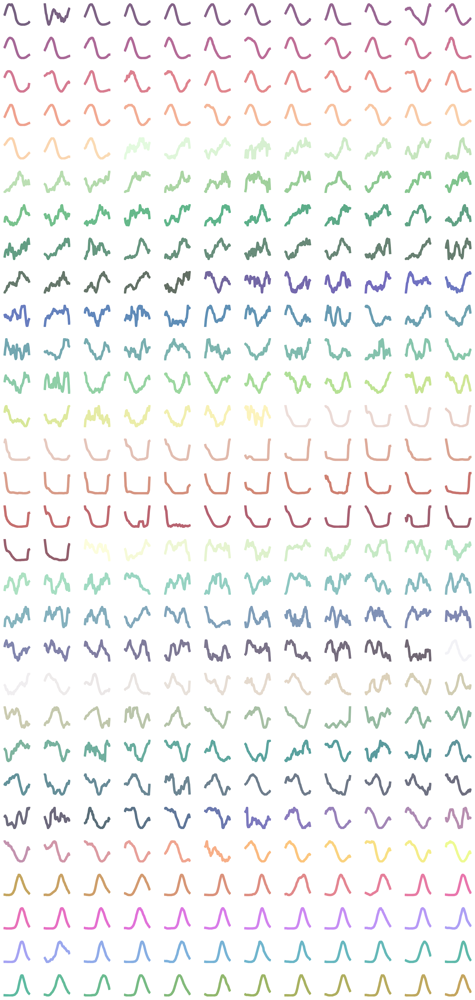

In [309]:
w = 1.15
h = 1.0
ncols = 12
nrows = 30
mult = 1.25

fig, ax = plt.subplots(nrows, ncols, figsize=(ncols*w*mult,nrows*h*mult), dpi=150)
plt.subplots_adjust(wspace=0.5,hspace=0.5)
tups = list(it.product(range(nrows), range(ncols)))


c = list(cmo.cm.matter_r(np.linspace(0,0.9,51))) +\
    list(cmo.cm.algae(   np.linspace(0,1,50))) +\
    list(cmo.cm.haline(  np.linspace(0,1,50))) +\
    list(cmo.cm.amp(     np.linspace(0.1,0.9,43))) +\
    list(cmo.cm.deep(    np.linspace(0,1,45))) +\
    list(cmo.cm.rain(    np.linspace(0,1,51))) +\
    list(cmo.cm.thermal( np.linspace(0,1,22))) +\
    list(cmo.cm.phase(   np.linspace(0,1,48)))

lw = 4.0
outx = out.copy()
# np.random.shuffle(outx)

for i, a in enumerate(tups):
    std_i = pd.Series(outx[i]).diff().std()
    ax[a].plot(outx[i],lw=lw*1.2,color=c[i])
    ax[a].plot(outx[i],lw=lw*1.1,color='.99',alpha=0.35)
    ax[a].set_axis_off()

plt.savefig('figs/pngs/sam_title_slide_360_sorted_iphone2.png',dpi=600,bbox_inches='tight')
plt.show()

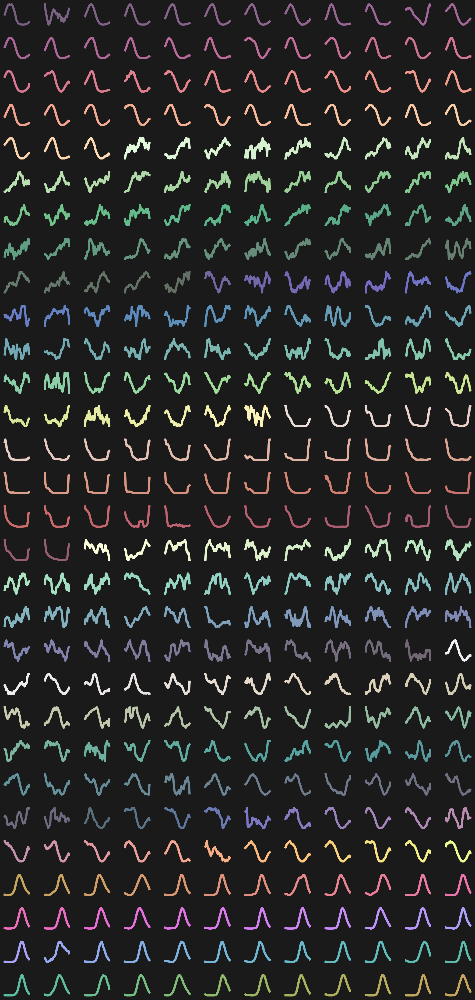

In [311]:
w = 1.15
h = 1.0
ncols = 12
nrows = 30
mult = 1.25

fig, ax = plt.subplots(nrows, ncols, figsize=(ncols*w*mult,nrows*h*mult), dpi=150,facecolor='.1')
plt.subplots_adjust(wspace=0.5,hspace=0.5)
tups = list(it.product(range(nrows), range(ncols)))


c = list(cmo.cm.matter_r(np.linspace(0,0.9,51))) +\
    list(cmo.cm.algae(   np.linspace(0,1,50))) +\
    list(cmo.cm.haline(  np.linspace(0,1,50))) +\
    list(cmo.cm.amp(     np.linspace(0.1,0.9,43))) +\
    list(cmo.cm.deep(    np.linspace(0,1,45))) +\
    list(cmo.cm.rain(    np.linspace(0,1,51))) +\
    list(cmo.cm.thermal( np.linspace(0,1,22))) +\
    list(cmo.cm.phase(   np.linspace(0,1,48)))

lw = 4.0
outx = out.copy()
# np.random.shuffle(outx)

for i, a in enumerate(tups):
    std_i = pd.Series(outx[i]).diff().std()
    ax[a].plot(outx[i],lw=lw*1.2,color=c[i])
    ax[a].plot(outx[i],lw=lw*1.1,color='.99',alpha=0.35)
    ax[a].set_axis_off()

plt.savefig('figs/pngs/sam_title_slide_360_sorted_iphone3.png',dpi=600,bbox_inches='tight',facecolor='.1')
plt.show()

In [307]:
(nrows*h*mult)/(ncols*w*mult)

2.0833333333333335

In [304]:
print(360/12)
print(30/12)
print(19.5/9)

30.0
2.5
2.1666666666666665


In [303]:
ncols*w*mult,nrows*h*mult

(30.0, 22.5)

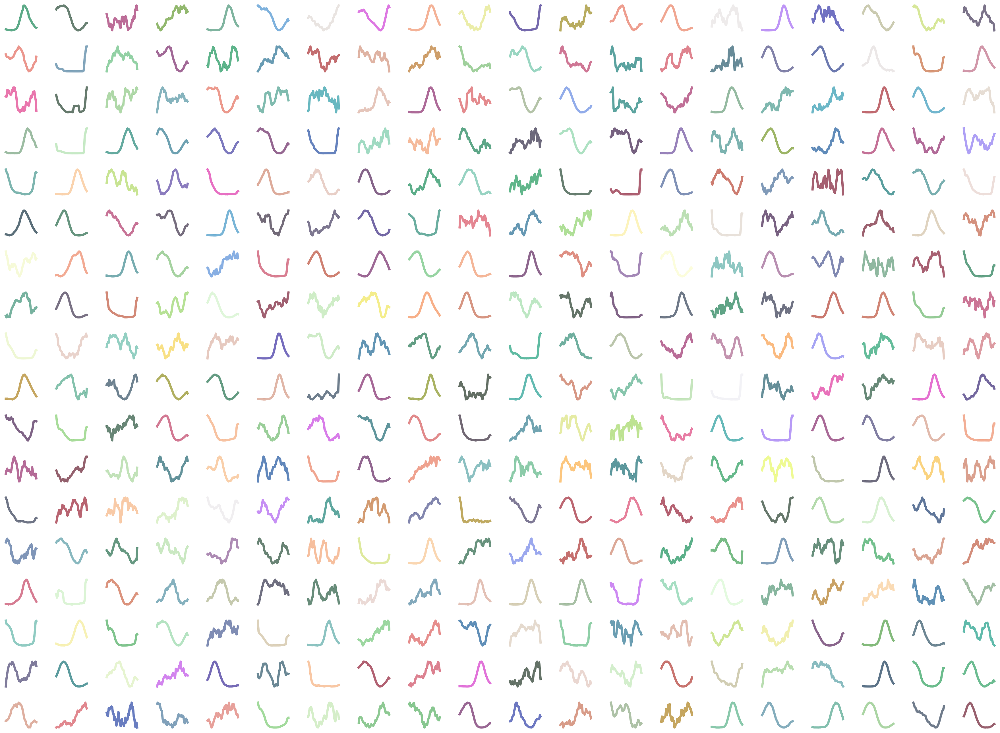

In [291]:
w = 1.2
h = 1.0
ncols = 20
nrows = 18
mult = 1.25

fig, ax = plt.subplots(nrows, ncols, figsize=(ncols*w*mult,nrows*h*mult), dpi=150)
plt.subplots_adjust(wspace=0.5,hspace=0.5)
tups = list(it.product(range(nrows), range(ncols)))


c = list(cmo.cm.matter_r(np.linspace(0,0.9,51))) +\
    list(cmo.cm.algae(   np.linspace(0,1,50))) +\
    list(cmo.cm.haline(  np.linspace(0,1,50))) +\
    list(cmo.cm.amp(     np.linspace(0.1,0.9,43))) +\
    list(cmo.cm.deep(    np.linspace(0,1,45))) +\
    list(cmo.cm.rain(    np.linspace(0,1,51))) +\
    list(cmo.cm.thermal( np.linspace(0,1,22))) +\
    list(cmo.cm.phase(   np.linspace(0,1,48)))

lw = 3.0
outx = out.copy()
np.random.shuffle(outx)
np.random.shuffle(c)

for i, a in enumerate(tups):
    std_i = pd.Series(outx[i]).diff().std()
    ax[a].plot(outx[i],lw=lw*1.2,color=c[i])
    ax[a].plot(outx[i],lw=lw*1.1,color='.99',alpha=0.35)
    ax[a].set_axis_off()

plt.savefig('figs/pngs/sam_title_slide_360_random.png',dpi=600,bbox_inches='tight')
plt.show()

In [112]:
len(out)

88

In [113]:
11/8

1.375

In [114]:
4/3

1.3333333333333333

In [36]:
pertussis['COLORADO']

0       NaN
1       NaN
2       NaN
3       NaN
4       NaN
       ... 
5513     21
5514     22
5515     19
5516     32
5517     28
Name: COLORADO, Length: 5518, dtype: object

In [ ]:
# CHLAMYDIA_Cases_2006-2014_20160707103149.csv
# Colombia
# exp_static_simulation_data_bulk_100.csv
# GONORRHEA_Cases_1972-2014_20160707103202.csv
# HEPATITIS_A_Cases_1966-2014_20160707103116.csv
# INFLUENZA_Cases_1919-1951_20151014132002.csv
# irr-sims
# irr-sims2
# MEASLES_Cases_1909-2001_20150923120449.csv
# MUMPS_Cases_1967-2014_20160707103045.csv
# POLIOMYELITIS_Cases_1921-1971_20150923114821.csv
# reg-sims
# reg-sims2
# San_Juan_Training_Data.csv
# WHOOPING_COUGH_[PERTUSSIS]_Cases_1909-2014_20160607104756.csv